# ILA Project

In [1]:
import transform
import analysis

%load_ext autoreload
%autoreload 2

In [2]:
image_path = r"./Boneyard_IMG_5341.jpg"

## 1. Fast Fourier Transform

In [3]:
fft = transform.FFT(image_path)
fft_vis = analysis.Visualization(fft)
fft_vis_more = analysis.Visualization(fft,fewer = False)

  0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 7/7 [00:16<00:00,  2.33s/it]


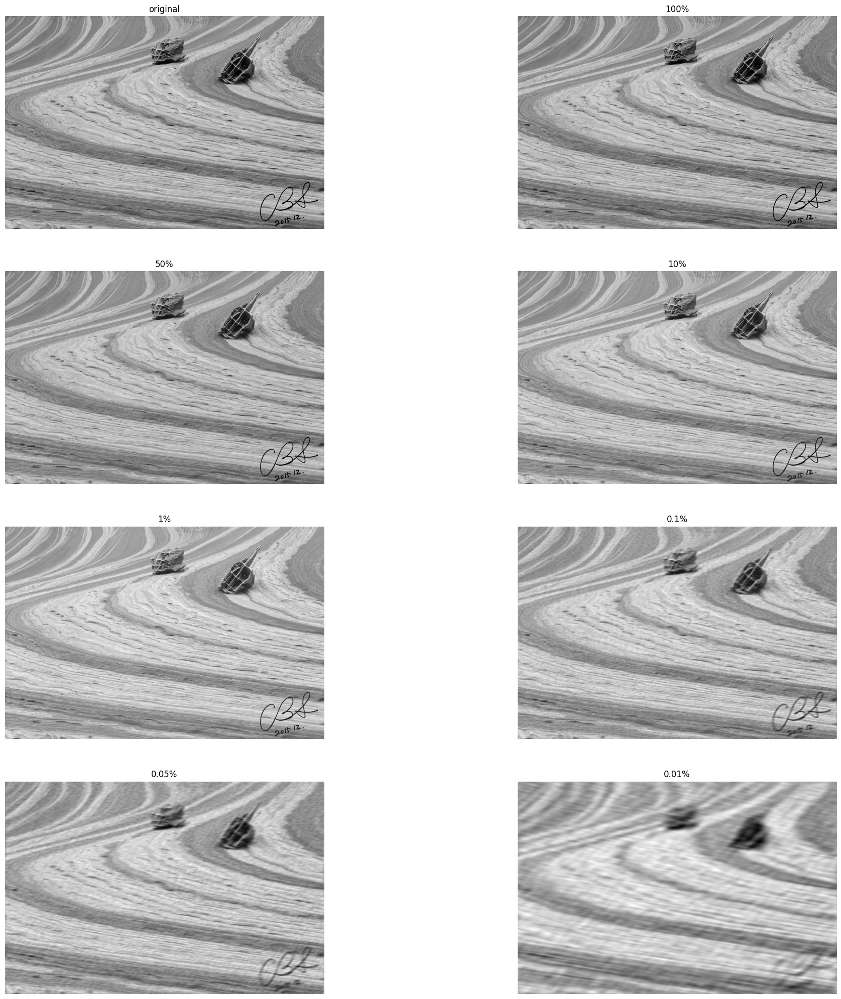

In [4]:
fft_vis.compare_the_whole_by_compression_ratio(grid_width=2)

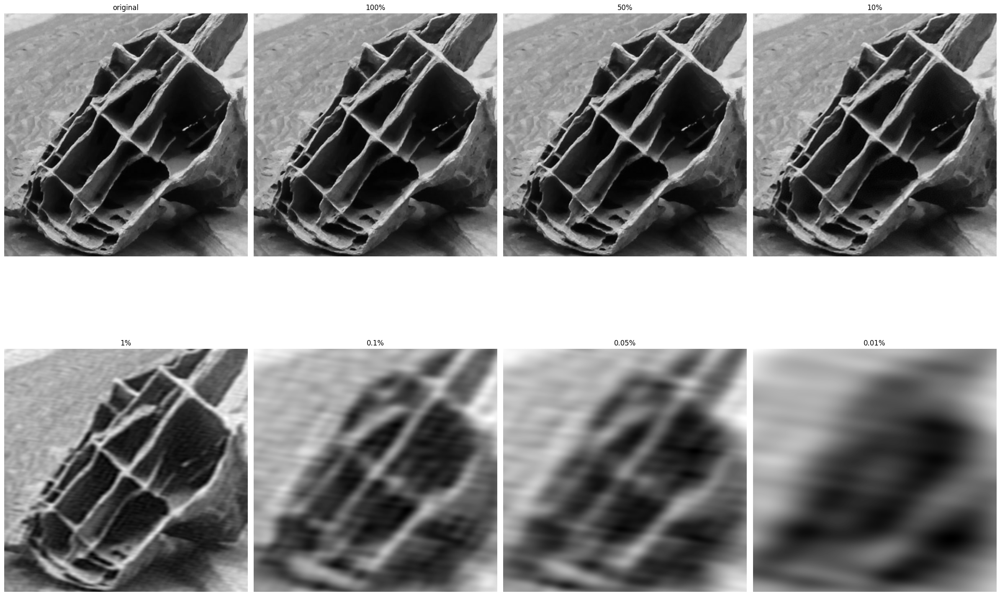

In [5]:
fft_vis.compare_the_waffle_by_compression_ratio(figsize=(24, 15), grid_width=4)

  0%|          | 0/22 [00:00<?, ?it/s]

100%|██████████| 22/22 [00:51<00:00,  2.36s/it]


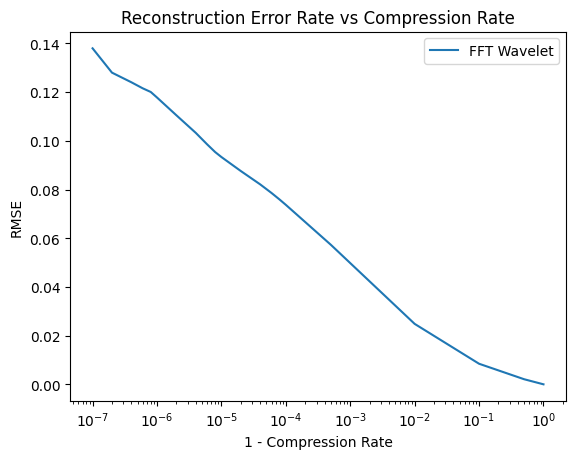

In [6]:
fft_vis_more.plot_rmse_by_compression_ratio(label="FFT Wavelet")

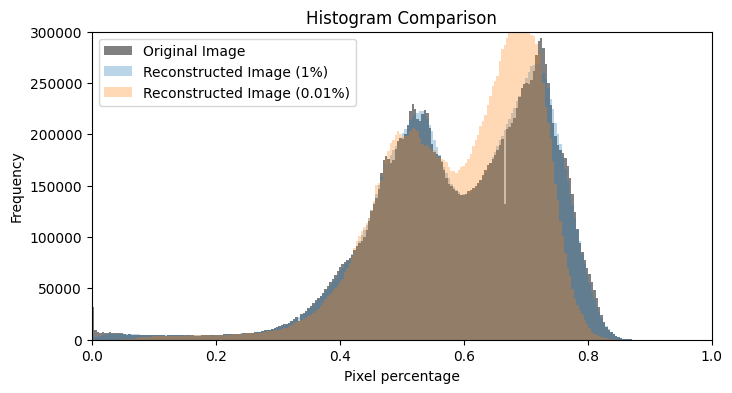

In [7]:
fft_vis.plot_histogram(["1%","0.01%"])

## 2. Haar Wavelet Transform

In [8]:
haar = transform.HaarWT(image_path)
haar_vis = analysis.Visualization(haar)
haar_vis_more = analysis.Visualization(haar,fewer = False)

  0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 7/7 [00:28<00:00,  4.08s/it]


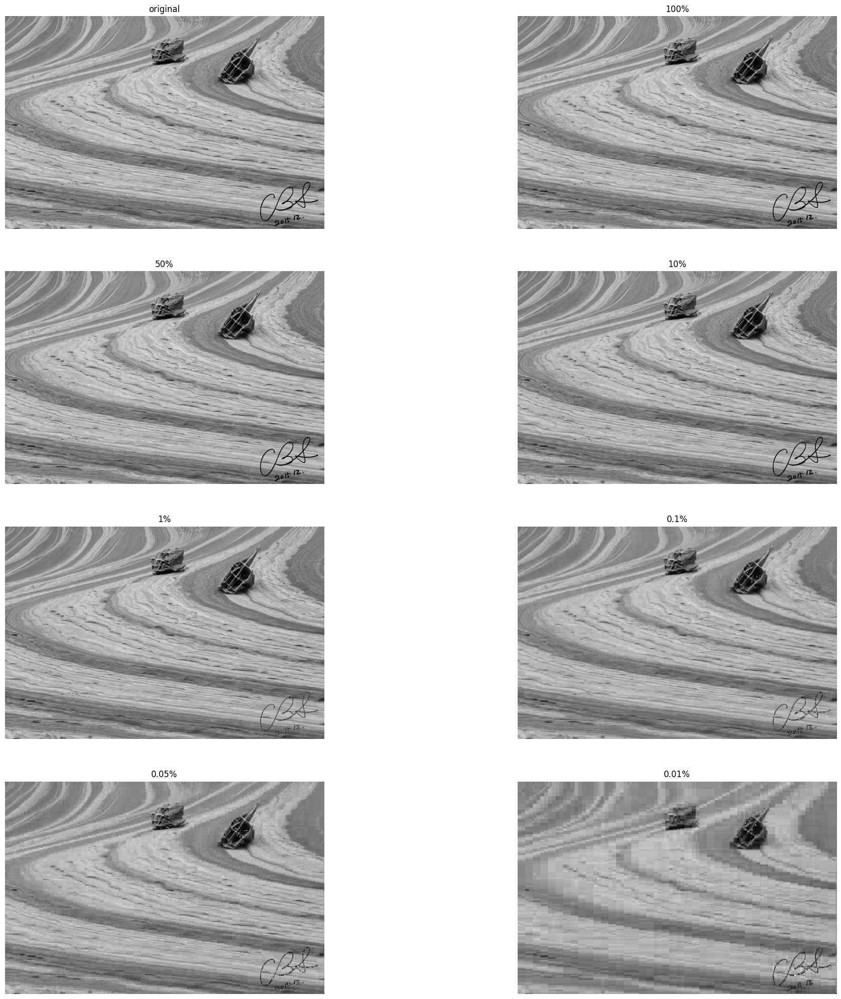

In [9]:
haar_vis.compare_the_whole_by_compression_ratio(grid_width=2)

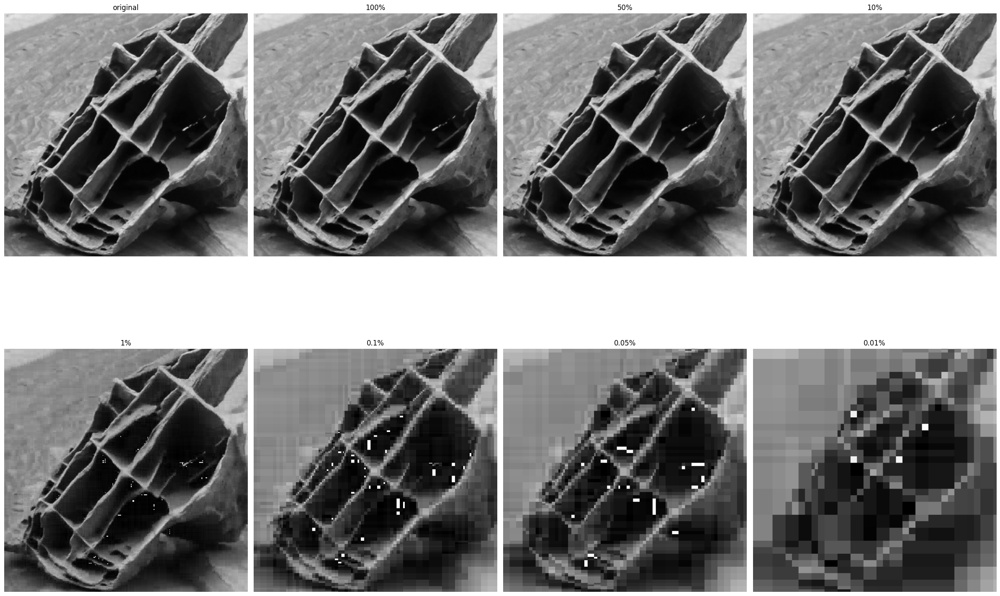

In [10]:
haar_vis.compare_the_waffle_by_compression_ratio(figsize=(24, 15), grid_width=4)

100%|██████████| 22/22 [01:29<00:00,  4.08s/it]


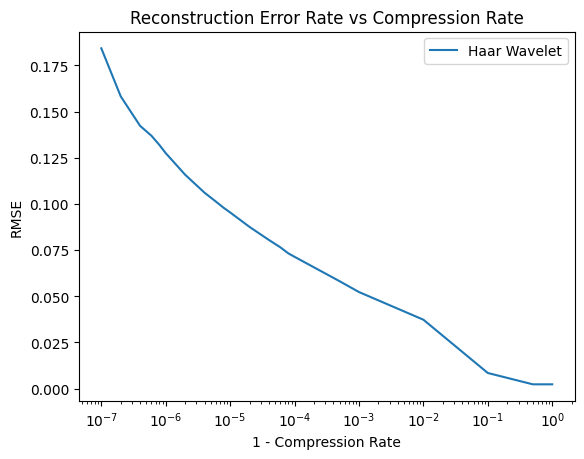

In [11]:
haar_vis_more.plot_rmse_by_compression_ratio(plot_onto_same_graph=False, label="Haar Wavelet")

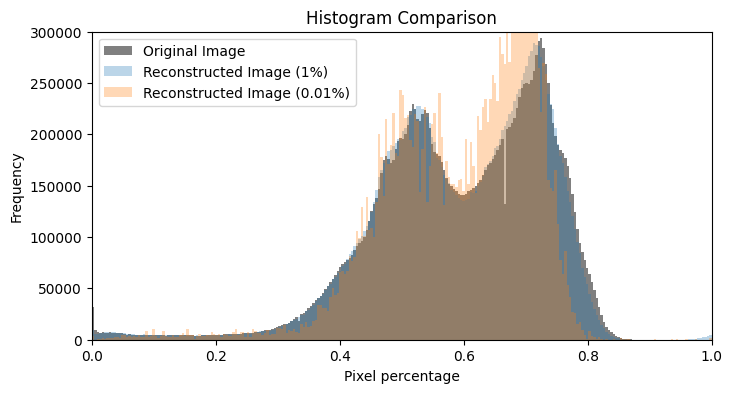

In [12]:
haar_vis.plot_histogram(["1%","0.01%"])

## 3. Continuous Wavelet Transformation

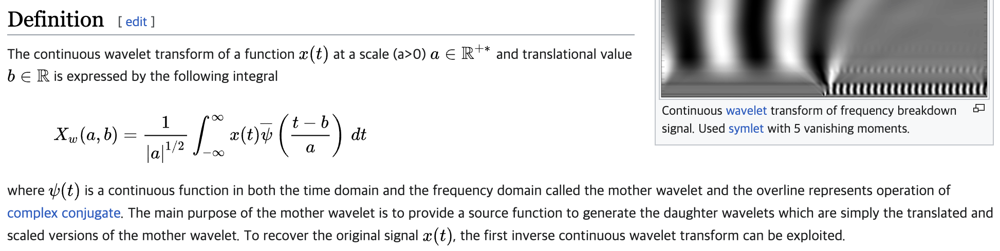

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.image import imread
from utils import quantize_complex_array

In [7]:
image = imread(image_path)
image = np.mean(image, axis=-1)

CWT는 DWT와 다르게 threshold로 compression을 하지않고, detail부분의 scale을 버리는 식으로 구현하였다. wiki에서 검색한 scale factor에 대한 설명은 다음과 같았다.

*The scale factor either dilates or compresses a signal. When the scale factor is relatively low, the signal is more contracted which in turn results in a more detailed resulting graph. However, the drawback is that low scale factor does not last for the entire duration of the signal. On the other hand, when the scale factor is high, the signal is stretched out which means that the resulting graph will be presented in less detail. Nevertheless, it usually lasts the entire duration of the signal.*

In [8]:
# set up a range of scales in logarithmic spacing between 1 and 256 (image width / 2 seems to work here)
ss = np.geomspace(1.0,256.0,100)

In [ ]:
# calculate the wavelet normalizations
cwt = transform.CWT(image_path)

In [ ]:
coeffs, wav_norm = cwt.transformed_matrix, cwt.wave_norm

In [10]:
# coeffs = np.load('../coeffs.npy')
# wav_norm = np.load('../wav_norm.npy')

In [7]:
def calculate_rmse(image1, image2):
    # Normalize pixel values to the range of 0 to 1
    image1 = image1 / 255.0
    image2 = image2 / 255.0

    # Calculate MSE
    mse = np.mean((image1 - image2) ** 2)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    return rmse

  0%|          | 0/100 [00:00<?, ?it/s]/home/jklee/anaconda3/envs/HRL/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':
100%|██████████| 100/100 [20:38<00:00, 12.38s/it]


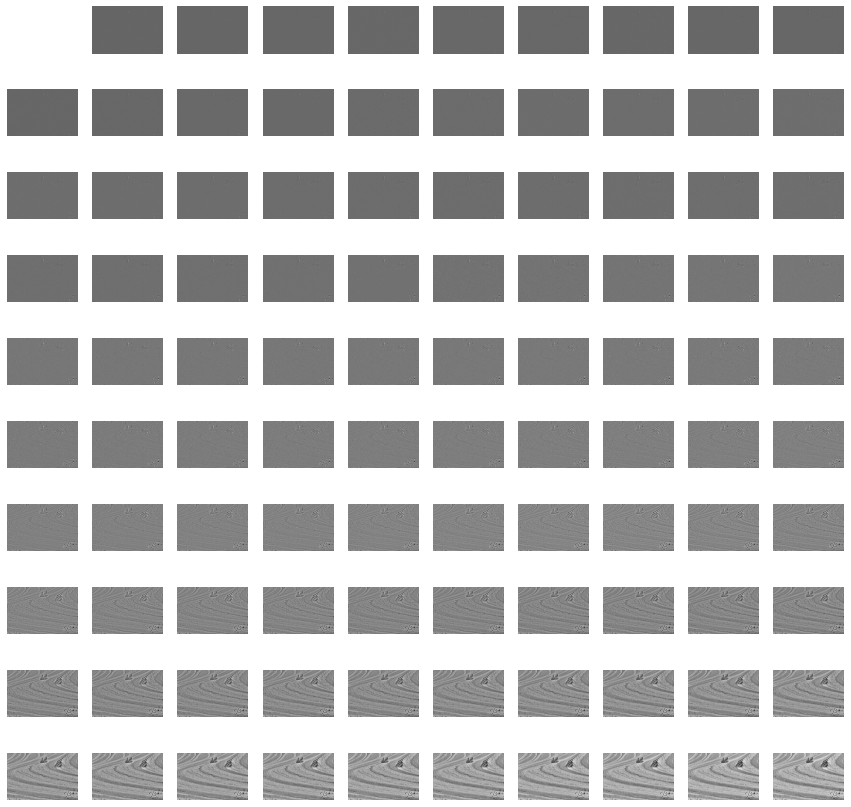

In [ ]:
# plot an image showing the combinations of all the scales
errors = []
N = 10
fig, axes = plt.subplots(nrows=N, ncols=N, figsize=(15, 15))
for level in tqdm(range(len(ss))):
    i = level // N
    j = level % N
    plt.sca(axes[i, j])
    plt.axis('off')
    C = 1.0 / (ss[:level] * wav_norm[:level])
    reconstruction = (C * np.real(coeffs[..., :level])).sum(axis=-1)
    reconstruction = 1.0 - (reconstruction - reconstruction.min()) / (reconstruction.max() - reconstruction.min())
    errors.append(calculate_rmse(reconstruction, image))
    plt.imshow(reconstruction, cmap='gray')
plt.show()

각 scale을 얼마나 활용하는지에 따라 시각적으로 이미지를 확인해본 결과, 90% 이상을 사용할 때 어느정도 원본 이미지가 복원되었다. 

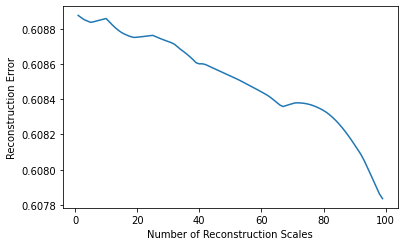

In [ ]:
fig2, ax2 = plt.subplots(nrows=1, ncols=1, figsize=(6, 6/1.618))
plt.plot(errors, label='norm')
plt.xlabel('Number of Reconstruction Scales')
plt.ylabel('Reconstruction Error')
plt.show()

원본 이미지와의 RMSE 또한 당연히 scale을 많이 쓸 수록 줄어드는 경향을 보인다.

In [ ]:
chosen_level = 96
C = 1.0 / (ss[:chosen_level] * wav_norm[:chosen_level])
chosen_reconstruction = (C * np.real(coeffs[..., :chosen_level])).sum(axis=-1)
chosen_reconstruction = 1.0 - (chosen_reconstruction - chosen_reconstruction.min()) / (chosen_reconstruction.max() - chosen_reconstruction.min())

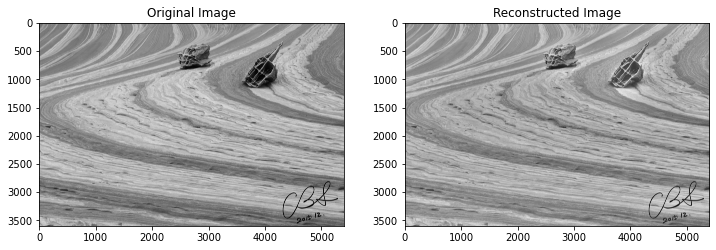

In [ ]:
# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(chosen_reconstruction, cmap='gray')
axes[1].set_title('Reconstructed Image')
plt.show()

그 중 임의로 하나의 scale을 정하여 이미지를 복원하였는데, 전반적으로 검은색이 줄어든 것을 확일할 수 있었다. 이는 크게 두 가지 이유로 보인다.
1) CWT 특성상 inverse transform을 할 때, DWT와 다르게 에러가 발생할 수 밖에없음.
2) 임의로 정한 scale의 값들이 해당 이미지를 표현하기에 최적화되지 않았을 수 있음.

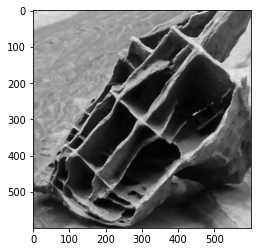

In [ ]:
# Original image
plt.imshow(image[550:1150,3600:4200], cmap='gray')
plt.show()

4it [00:53, 13.41s/it]


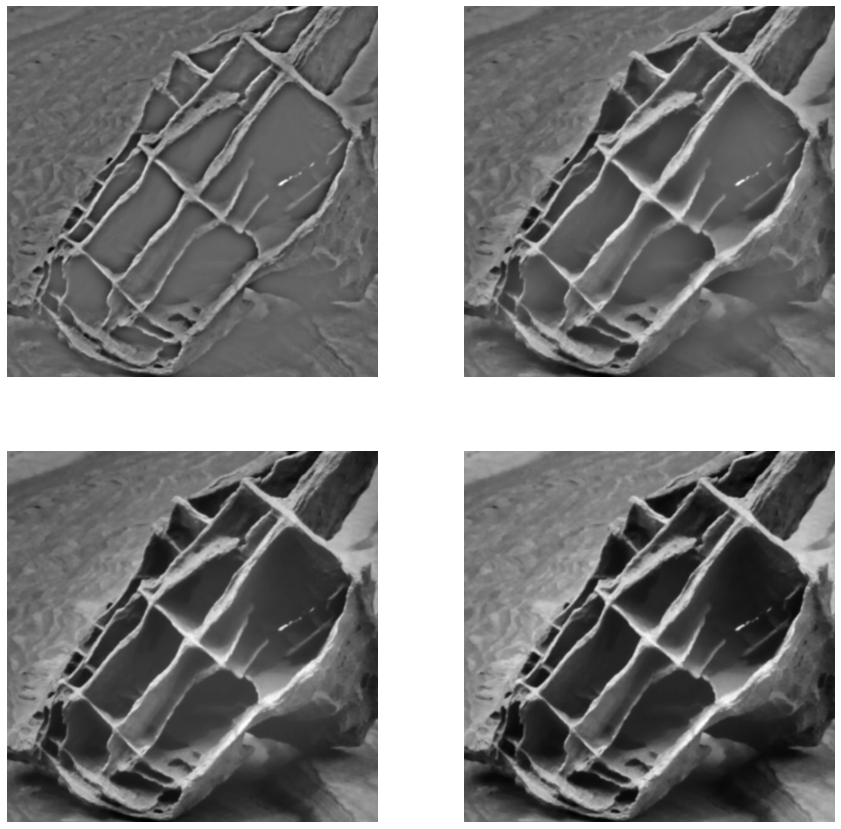

In [ ]:
# plot an complicate structure showing the combinations of certain the scales
levels = [40, 60, 80, 90]
N = 2
fig, axes = plt.subplots(nrows=N, ncols=N, figsize=(15, 15))
for idx, level in tqdm(enumerate(levels)):
    i = idx // N
    j = idx % N
    plt.sca(axes[i, j])
    plt.axis('off')
    C = 1.0 / (ss[:level] * wav_norm[:level])
    reconstruction = (C * np.real(coeffs[..., :level])).sum(axis=-1)
    reconstruction = 1.0 - (reconstruction - reconstruction.min()) / (reconstruction.max() - reconstruction.min())
    plt.imshow(reconstruction[550:1150,3600:4200], cmap='gray')
plt.show()

사진에서 가장 복잡해 보이는 구조물을 택해서 자세히 살펴본 결과, DWT와는 다르게 특정 부분에서 이미지가 깨져 흰색으로 보이는 현상이 나타나지 않고, 전반적으로 균질적으로 이미지가 부정확해진다. 이 또한 CWT를 활용하는 특징 중 하나라고 생각된다.

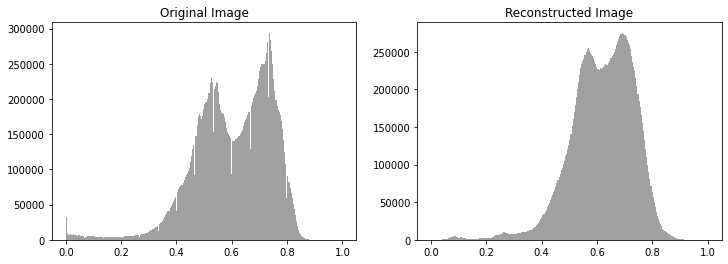

In [ ]:
image = (image - image.min()) / (image.max() - image.min())
flattened_image = image.flatten()
flattened_r_image = chosen_reconstruction.flatten()

# Plotting the histogram of original image
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(flattened_image, bins=256, range=[0,1], density=False, color='gray', alpha=0.75)
axes[0].set_title('Original Image')
axes[1].hist(flattened_r_image, bins=256, range=[0,1], density=False, color='gray', alpha=0.75)
axes[1].set_title('Reconstructed Image')
plt.show()

히스토그램으로 만들어진 이미지를 확인해 볼 때, 분포가 좀 더 smooth해지고, 중앙 값에 더 모이는 것을 확인 할 수 있었다. 특히 검은색 부분(0)이 많이 사라진 것을 두드러지게 확인할 수 있었다.

### CWT with compression by quantization
Scale을 활용한 이미지 압축 외에 다른 방법으로, quantization을 시도해 보았다. Scale 압축 방식은 불필요한 scale을 버림으로써 압축을 하는 반면, quantization은 모든 scale을 사용하되, CWT로 변환된 각 값들을 quantization하여 압축하는 방법이다. 이 방법이 효과가 과연 있을지 실험해보았다.

In [11]:
# 4비트 quantization, 1/16 약 95% 압축
quantized_coeffs_4 = quantize_complex_array(coeffs, 4)
chosen_level = 100
C = 1.0 / (ss[:chosen_level] * wav_norm[:chosen_level])
reconstruction_4 = (C * np.real(quantized_coeffs_4[..., :chosen_level])).sum(axis=-1)
reconstruction_4 = 1.0 - (reconstruction_4 - reconstruction_4.min()) / (reconstruction_4.max() - reconstruction_4.min())
# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(reconstruction_4, cmap='gray')
axes[1].set_title('Reconstructed Image 4bit')
plt.show()

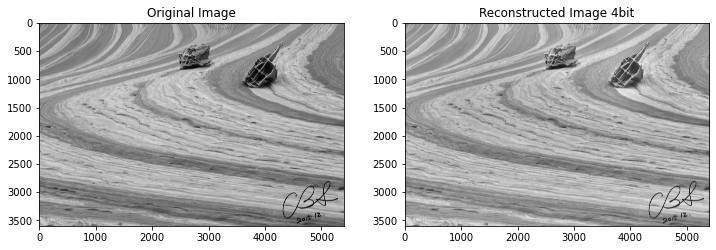

In [ ]:
# 3비트 quantization
quantized_coeffs_3 = quantize_complex_array(coeffs, 3)
chosen_level = 100
C = 1.0 / (ss[:chosen_level] * wav_norm[:chosen_level])
reconstruction_3 = (C * np.real(quantized_coeffs_3[..., :chosen_level])).sum(axis=-1)
reconstruction_3 = 1.0 - (reconstruction_3 - reconstruction_3.min()) / (reconstruction_3.max() - reconstruction_3.min())
# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(reconstruction_3, cmap='gray')
axes[1].set_title('Reconstructed Image 3bit')
plt.show()

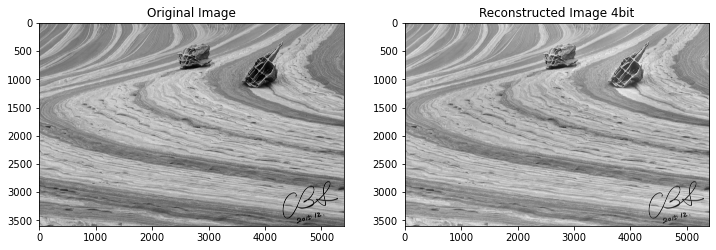

In [ ]:
# 1비트
quantized_coeffs_1 = quantize_complex_array(coeffs, 1)
chosen_level = 100
C = 1.0 / (ss[:chosen_level] * wav_norm[:chosen_level])
reconstruction_1 = (C * np.real(quantized_coeffs_1[..., :chosen_level])).sum(axis=-1)
reconstruction_1 = 1.0 - (reconstruction_1 - reconstruction_1.min()) / (reconstruction_1.max() - reconstruction_1.min())
# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(reconstruction_1, cmap='gray')
axes[1].set_title('Reconstructed Image 1bit')
plt.show()

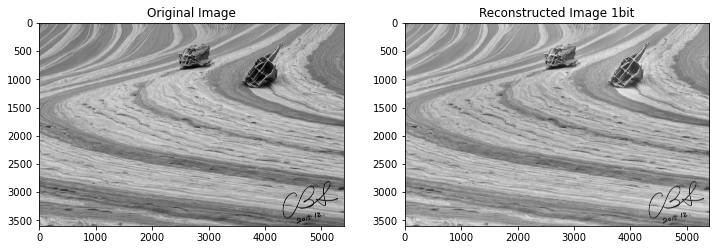

4비트, 3비트, 1비트 quantization을 한 결과, 원본 이미지보다는 전반적인 이미지 품질이 떨어지고, 명암의 구분이 희미해졌으나, 각 quantization 끼리의 차이는 육안으로 거의 확인이 불가능하였다. 이를 좀 더 명확히 확인하여 히스토그램을 그려보았다.

In [ ]:
image = (image - image.min()) / (image.max() - image.min())
flattened_image = image.flatten()
flattened_4 = reconstruction_4.flatten()
flattened_3 = reconstruction_3.flatten()
flattened_1 = reconstruction_1.flatten()

# Plotting the histogram of original image
fig, axes = plt.subplots(1, 4, figsize=(20, 4))
axes[0].hist(flattened_image, bins=256, range=[0,1], density=False, color='gray', alpha=0.75)
axes[0].set_title('Original Image')
axes[1].hist(flattened_4, bins=256, range=[0,1], density=False, color='gray', alpha=0.75)
axes[1].set_title('4 bit Reconstructed Image')
axes[2].hist(flattened_3, bins=256, range=[0,1], density=False, color='gray', alpha=0.75)
axes[2].set_title('3 bit Reconstructed Image')
axes[3].hist(flattened_1, bins=256, range=[0,1], density=False, color='gray', alpha=0.75)
axes[3].set_title('1 bit Reconstructed Image')
plt.show()

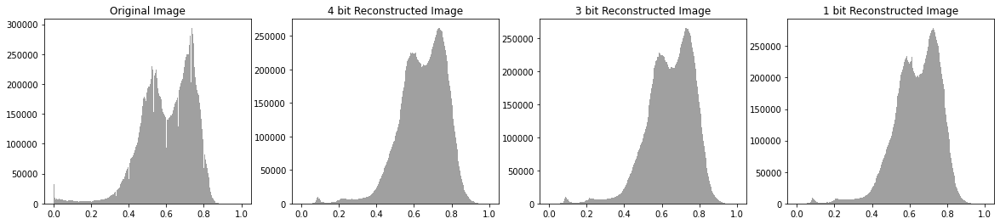

히스토그램 확인 결과, 각 압축률에 따라 그 분포 양상이 거의 유사하였다. 이는 어쩌면 당연한 결과인데, scale 값을 100으로 하였으므로, 1비트 기준으로 2^100개의 경우의 수를 표현할 수 있는데, 이미지 픽셀이 가질 수 있는 값은 256가지이므로, 완전히 표현가능하다. 즉, 다른 말로 하면, quantization 방법은 압축에 전혀 도움이 되지 않음을 확인할 수 있었다.

# 4. 비교분석


In [1]:
import transform
import analysis

%load_ext autoreload
%autoreload 2
image_path = r"./Boneyard_IMG_5341.jpg"

In [11]:
fft = transform.FFT(image_path)
fft_vis = analysis.Visualization(fft)
fft_vis_more = analysis.Visualization(fft,fewer = False)

haar = transform.HaarWT(image_path)
haar_vis = analysis.Visualization(haar)
haar_vis_more = analysis.Visualization(haar,fewer = False)

## 4.1. RMSE plot비교 
* FFT가 HaarWavelet보다 더 좋은 것을 잘 유지한다는 것을 볼 수 있다 (at least according to MSE)

In [13]:
haar_vis_more.plot_rmse_by_compression_ratio(plot_onto_same_graph=True, label="Haar Wavelet")
fft_vis_more.plot_rmse_by_compression_ratio(label="FFT")

  0%|          | 0/22 [00:00<?, ?it/s]

 14%|█▎        | 3/22 [00:11<01:14,  3.94s/it]

## 4.0 이미지 자체 비교 

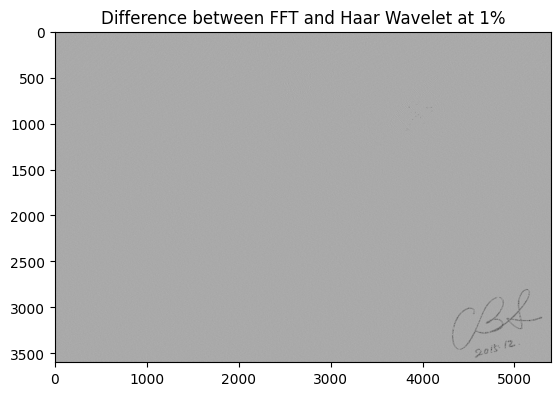

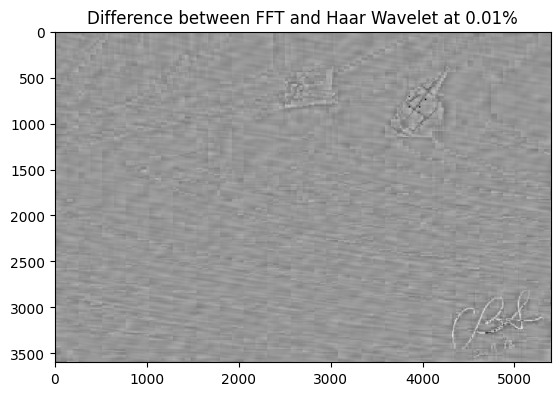

In [17]:
import numpy as np
import matplotlib.pyplot as plt
def subtract_img(img1, img2):
    return (img1 - img2)

percentages_to_see = ["1%","0.01%"]
for percentage in percentages_to_see:
    fft_img = fft_vis_more.reconstructed_images[percentage]
    haar_img = haar_vis_more.reconstructed_images[percentage]
    #plot the difference
    diff = subtract_img(fft_img, haar_img)
    plt.title(f"Difference between FFT and Haar Wavelet at {percentage}")
    plt.imshow(diff, cmap='gray')
    plt.show()
    


## 4.2. Histogram 비교 

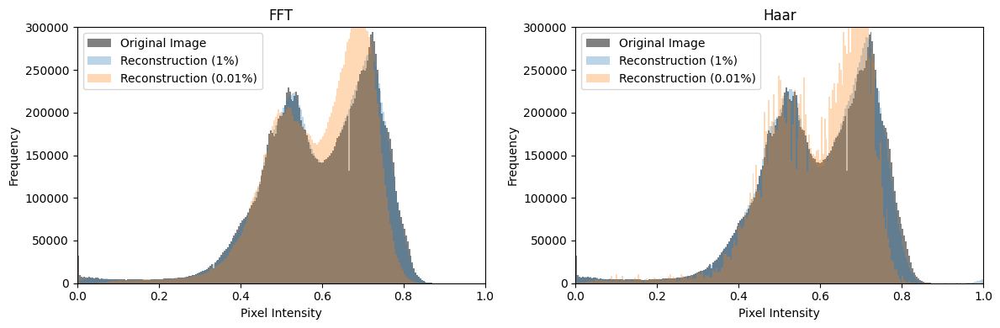

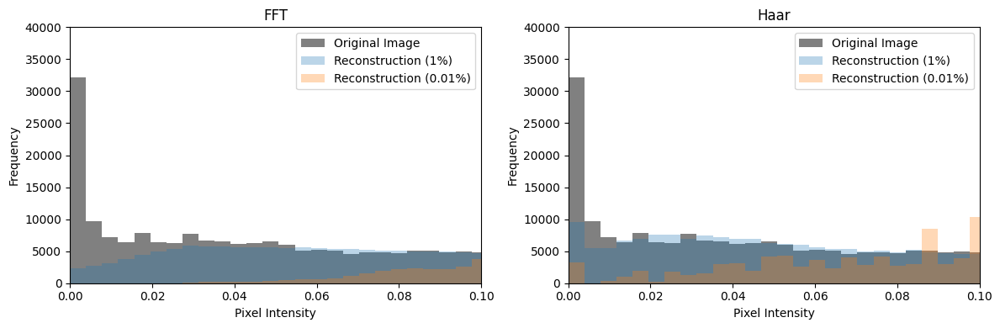

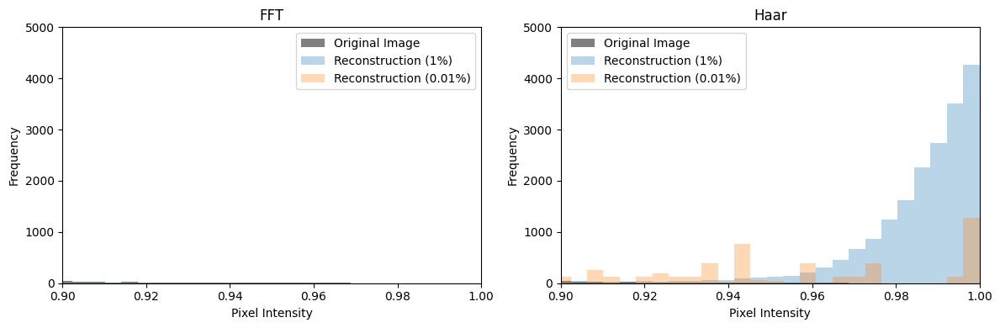

In [5]:
fft_vis.plot_histogram(["1%","0.01%"],second_image=haar_vis, title_1= "FFT", title_2="Haar")
fft_vis.plot_histogram(["1%","0.01%"],second_image=haar_vis, title_1= "FFT", title_2="Haar",xrange=[0,0.1],yrange=[0,40000])
fft_vis.plot_histogram(["1%","0.01%"],second_image=haar_vis, title_1= "FFT", title_2="Haar",xrange=[0.9,1],yrange=[0,5000])
#the FFt range might be chagned to 0 to 100 if needed (yscale)